In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras import regularizers

from sklearn.metrics import silhouette_score


In [ ]:
csv_path = '/content/drive/MyDrive/dataset/100k_pos_tr_spec_R100.csv'

# Load the dataset
df = pd.read_csv(csv_path)
data = df.to_numpy()

# Display shape
print("Shape:", df.shape)
df.head()

Shape: (98664, 280)


,0,1,2,3,4,5,6,7,8,9,...,R_p,g_p,Temp,log_kappa_cloud,log_P_cloud,log_H2O,log_CO2,log_CO,log_CH4,log_NH3
0,0.004014,0.004014,0.004014,0.004014,0.004014,0.004014,0.004014,0.004014,0.004014,0.004014,...,1.658348,17.176982,3327.875478,-3.855474,-3.844470,-8.889865,-4.018888,-3.195541,-7.868857,-5.895533
1,0.000107,0.000107,0.000107,0.000107,0.000107,0.000107,0.000107,0.000107,0.000107,0.000107,...,0.258443,16.036432,2034.071133,-3.014919,-2.962217,-3.225697,-2.038615,-5.329029,-3.169883,-3.206833
2,0.000358,0.000358,0.000358,0.000358,0.000357,0.000357,0.000357,0.000357,0.000357,0.000357,...,0.503774,9.066010,1712.661454,-2.246068,-1.677456,-3.993484,-2.895214,-7.397882,-8.908273,-7.172669
3,0.012516,0.012516,0.012516,0.012516,0.012516,0.012516,0.012515,0.012515,0.012515,0.012515,...,0.562965,7.254639,3287.260930,-1.086659,-3.761693,-8.448541,-3.301345,-4.516020,-7.289866,-7.753208
4,0.001427,0.001427,0.001427,0.001427,0.001427,0.001427,0.001427,0.001427,0.001427,0.001427,...,0.745250,35.230361,2895.010899,-1.323324,-1.794849,-8.350682,-4.666140,-6.680365,-6.197769,-5.475105


In [ ]:
parameters = ['R_s', 'R_p', 'g_p', 'Temp', 'log_kappa_cloud', 'log_P_cloud','log_H2O','log_CO2','log_CO','log_CH4','log_NH3']



In [ ]:
df.describe(include = 'all')

,0,1,2,3,4,5,6,7,8,9,...,R_p,g_p,Temp,log_kappa_cloud,log_P_cloud,log_H2O,log_CO2,log_CO,log_CH4,log_NH3
count,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,...,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000
mean,0.010438,0.010436,0.010434,0.010432,0.010431,0.010429,0.010428,0.010426,0.010425,0.010424,...,1.060991,22.680367,1990.529089,-3.203587,-1.506352,-5.497066,-5.490777,-5.500600,-5.500026,-5.508865
std,0.018097,0.018095,0.018093,0.018090,0.018088,0.018086,0.018084,0.018082,0.018080,0.018079,...,0.542885,10.043365,866.480792,2.187283,1.445999,2.021719,2.020946,2.027659,2.023330,2.020505
min,0.000003,0.000003,0.000002,0.000002,0.000002,0.000002,0.000002,0.000002,0.000002,0.000002,...,0.100042,5.000412,500.059513,-6.999982,-3.999971,-8.999924,-8.999969,-8.999911,-8.999990,-8.999985
25%,0.001309,0.001309,0.001308,0.001308,0.001307,0.001307,0.001306,0.001305,0.001305,0.001305,...,0.593661,14.036827,1238.898762,-5.087822,-2.762471,-7.250021,-7.239419,-7.264763,-7.260083,-7.261356
50%,0.004088,0.004087,0.004086,0.004085,0.004084,0.004084,0.004083,0.004083,0.004082,0.004081,...,1.061147,22.724996,1986.033911,-3.215291,-1.504305,-5.488896,-5.485339,-5.499874,-5.502937,-5.508495
75%,0.010495,0.010493,0.010488,0.010486,0.010485,0.010483,0.010480,0.010479,0.010479,0.010477,...,1.531775,31.344526,2737.571477,-1.317402,-0.255494,-3.753459,-3.741738,-3.740803,-3.745523,-3.763974
max,0.180863,0.180862,0.180862,0.180862,0.180861,0.180861,0.180861,0.180861,0.180860,0.180860,...,1.999990,39.999593,3499.933503,0.599861,0.999957,-2.000011,-2.000260,-2.000041,-2.000107,-2.000021


In [ ]:
spectra = data[:, :269]
labels = data[:, 269:]

labels_df = pd.DataFrame(labels)

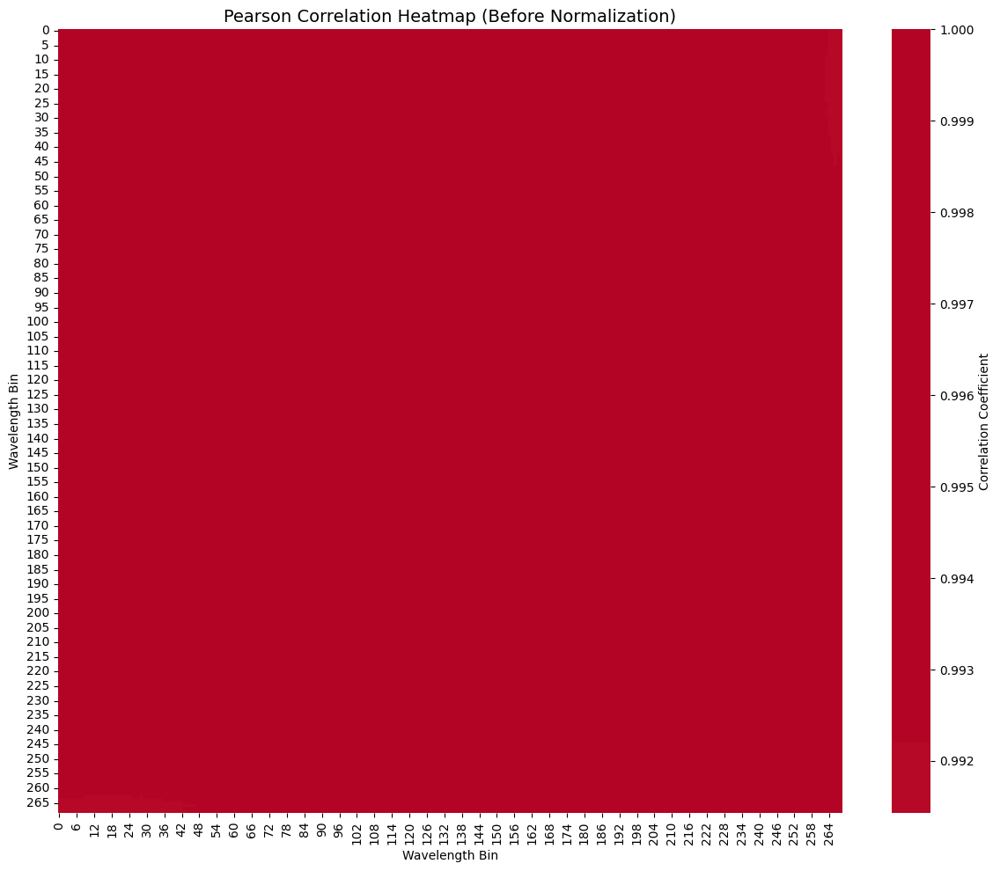

In [ ]:

spectra_df = pd.DataFrame(spectra[:5000])

# Compute Pearson correlation matrix
corr_raw = spectra_df.corr()

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_raw, cmap='coolwarm', center=0, cbar_kws={'label': 'Correlation Coefficient'})
plt.title('Pearson Correlation Heatmap (Before Normalization)', fontsize=14)
plt.xlabel('Wavelength Bin')
plt.ylabel('Wavelength Bin')
plt.tight_layout()
plt.show()

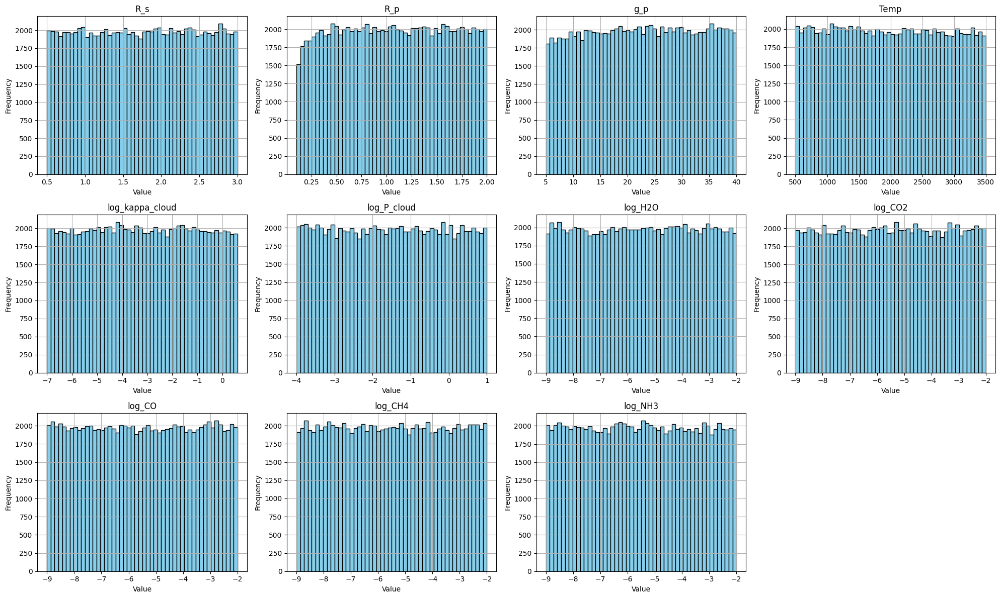

In [ ]:
# Parameter names
param_names = ['R_s', 'R_p', 'g_p', 'Temp',
               'log_kappa_cloud', 'log_P_cloud',
               'log_H2O', 'log_CO2', 'log_CO',
               'log_CH4', 'log_NH3']

# Extract labels from DataFrame
labels_df = pd.DataFrame(data[:, 269:], columns=param_names)

# Plot histograms
plt.figure(figsize=(20, 12))
for i, param in enumerate(param_names):
    plt.subplot(3, 4, i+1)
    plt.hist(labels_df[param], bins=50, color='skyblue', edgecolor='black')
    plt.title(param)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
normalized_spectra = np.zeros_like(spectra)

for i in range(spectra.shape[0]):
    spec = spectra[i, :]
    mean = np.mean(spec)
    std = np.std(spec)
    normalized_spectra[i, :] = (spec - mean) / std

In [ ]:
normalized_spectra.shape

(98664, 269)

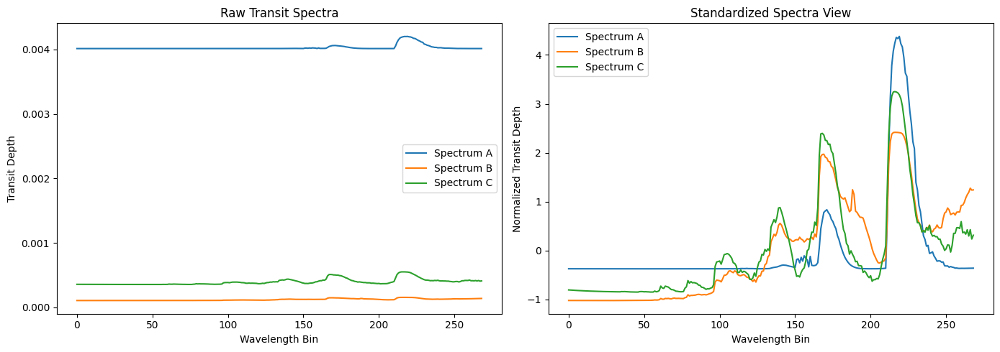

In [ ]:
plt.figure(figsize=(14, 5))

# Original spectra
plt.subplot(1, 2, 1)
plt.plot(spectra[0], label='Spectrum A')
plt.plot(spectra[1], label='Spectrum B')
plt.plot(spectra[2], label='Spectrum C')
plt.title('Raw Transit Spectra')
plt.xlabel('Wavelength Bin')
plt.ylabel('Transit Depth')
plt.legend()

# Normalized spectra
plt.subplot(1, 2, 2)
plt.plot(normalized_spectra[0], label='Spectrum A')
plt.plot(normalized_spectra[1], label='Spectrum B')
plt.plot(normalized_spectra[2], label='Spectrum C')
plt.title('Standardized Spectra View')
plt.xlabel('Wavelength Bin')
plt.ylabel('Normalized Transit Depth')
plt.legend()

plt.tight_layout()
plt.show()


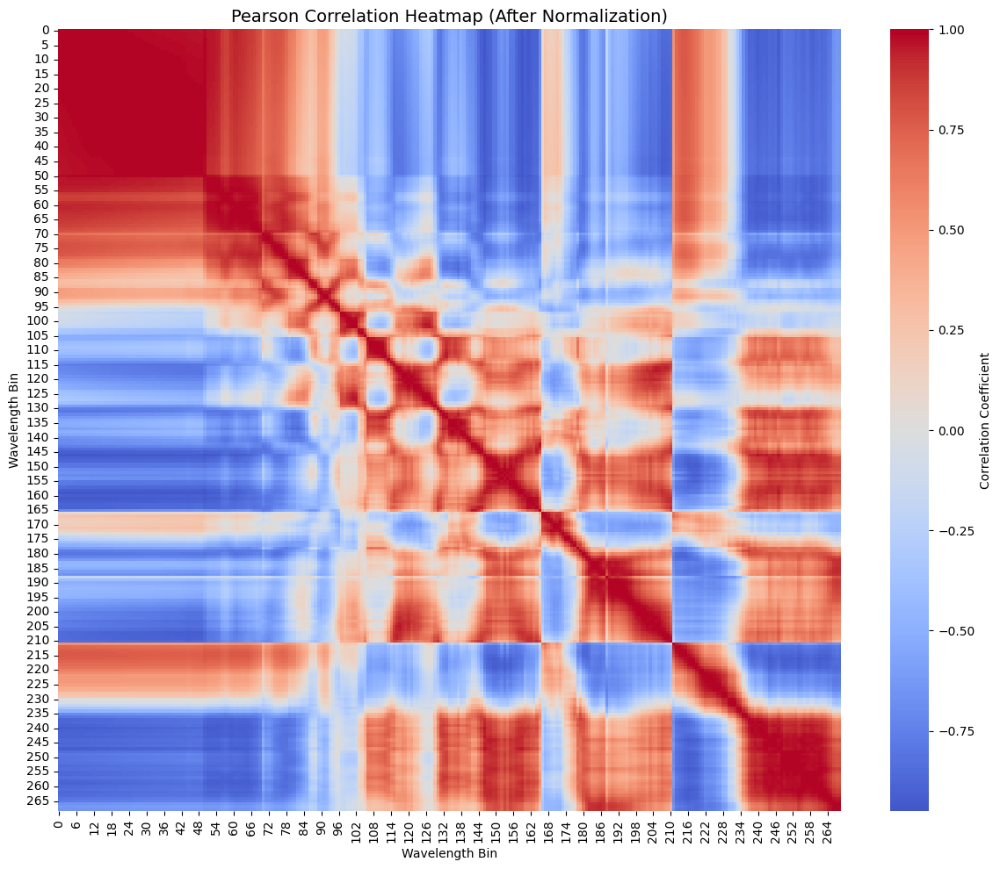

In [ ]:
norm_df = pd.DataFrame(normalized_spectra[:20])

# Compute Pearson correlation matrix
corr_norm = norm_df.corr()

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_norm, cmap='coolwarm', center=0, cbar_kws={'label': 'Correlation Coefficient'})
plt.title('Pearson Correlation Heatmap (After Normalization)', fontsize=14)
plt.xlabel('Wavelength Bin')
plt.ylabel('Wavelength Bin')
plt.tight_layout()
plt.show()

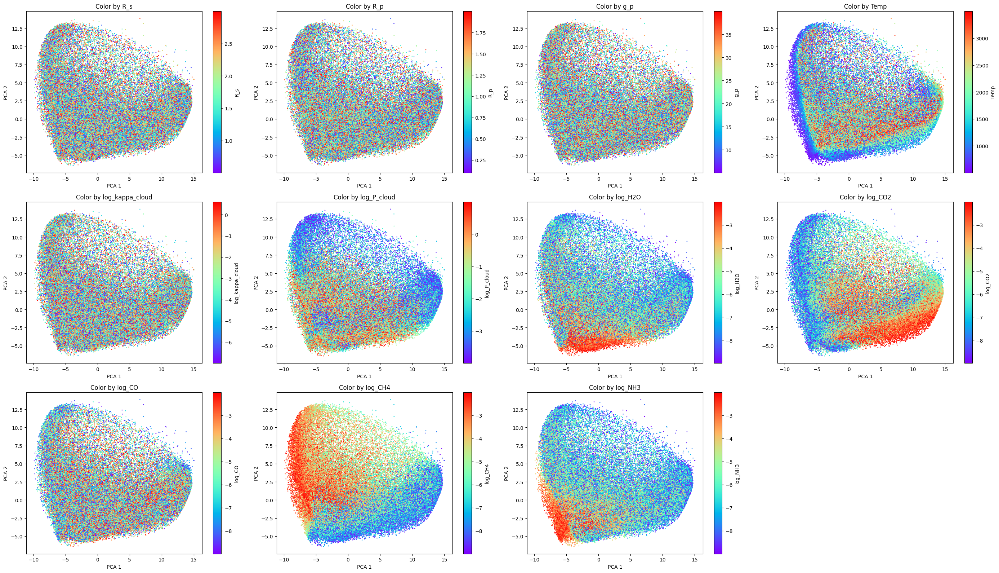

In [ ]:
# Perform PCA on normalized spectra
pca = PCA(n_components=2)
PCA_out = pca.fit_transform(normalized_spectra)

# Define target parameter names and extract them
param_names = ['R_s', 'R_p', 'g_p', 'Temp',
               'log_kappa_cloud', 'log_P_cloud',
               'log_H2O', 'log_CO2', 'log_CO',
               'log_CH4', 'log_NH3']
target_params = data[:, 269:]

# Plot: PCA space colored by each parameter
fig = plt.figure(figsize=(28, 16))
for i in range(11):
    plt.subplot(3, 4, i+1)
    plt.scatter(PCA_out[:, 0], PCA_out[:, 1],
                c=target_params[:, i], cmap='rainbow', s=1)
    plt.colorbar(label=param_names[i])
    plt.xlabel('PCA 1')
    plt.ylabel('PCA 2')
    plt.title(f'Color by {param_names[i]}')

plt.tight_layout()
plt.show()

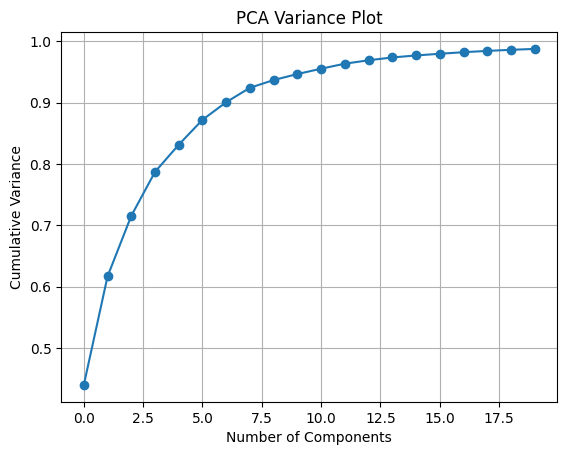

In [ ]:
# Perform PCA with 20 components
pca = PCA(n_components=20)
PCA_out = pca.fit_transform(normalized_spectra[:, :269])

# Plot cumulative explained variance
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance')
plt.title('PCA Variance Plot')
plt.grid(True)
plt.show()


# **From the above variance plot we chose 8 features for dimensionality     reduction to the data for downstream tasks based on the pivot in the plot as well as the limited scope of using quantum algorithms.**

In [ ]:
# Input layer
input_dim = 269
encoding_dim = 8

# Encoder
input_spec = Input(shape=(input_dim,))
encoded = Dense(128, activation='relu')(input_spec)
encoded = Dense(64, activation='relu')(encoded)
encoded = Dense(encoding_dim, activation='linear')(encoded)

# Decoder
decoded = Dense(64, activation='relu')(encoded)
decoded = Dense(128, activation='relu')(decoded)
decoded = Dense(input_dim, activation='linear')(decoded)

# Autoencoder model
autoencoder = Model(inputs=input_spec, outputs=decoded)
autoencoder.compile(optimizer='adam', loss='mse')

# Encoder model to extract 5D features
encoder = Model(inputs=input_spec, outputs=encoded)

# Train
history = autoencoder.fit(normalized_spectra, normalized_spectra,
                epochs=50,
                batch_size=256,
                shuffle=True,
                validation_split=0.1)


Epoch 1/50
347/347 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 0.2288 - val_loss: 0.0161
Epoch 2/50
347/347 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0142 - val_loss: 0.0095
Epoch 3/50
347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0090 - val_loss: 0.0075
Epoch 4/50
347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0071 - val_loss: 0.0062
Epoch 5/50
347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0061 - val_loss: 0.0055
Epoch 6/50
347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0054 - val_loss: 0.0050
Epoch 7/50
347/347 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.0050 - val_loss: 0.0050
Epoch 8/50
347/347 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0047 - val_loss: 0.0044
Epoch 9/50
347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 10/50
347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0042 - val_loss: 0.0040
Epoch 11/50
347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0040 - val_loss: 0.0037
Epoch 12/50
347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step

In [ ]:
X_autoenc = encoder.predict(normalized_spectra)
print(X_autoenc.shape)


3084/3084 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
(98664, 8)


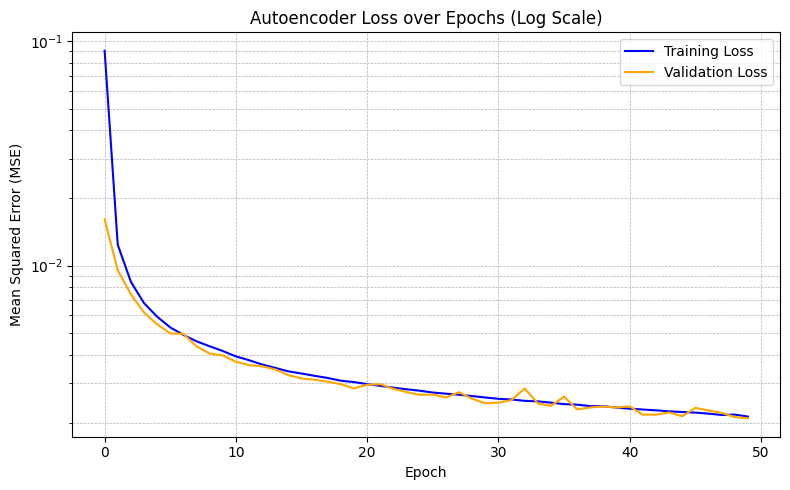

In [ ]:
# Plot training & validation loss

plt.figure(figsize=(8, 5))
plt.plot(history.history['loss'], label='Training Loss', color='blue')
plt.plot(history.history['val_loss'], label='Validation Loss', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error (MSE)')
plt.title('Autoencoder Loss over Epochs (Log Scale)')
plt.yscale('log')  # Set y-axis to log scale
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.tight_layout()
plt.show()


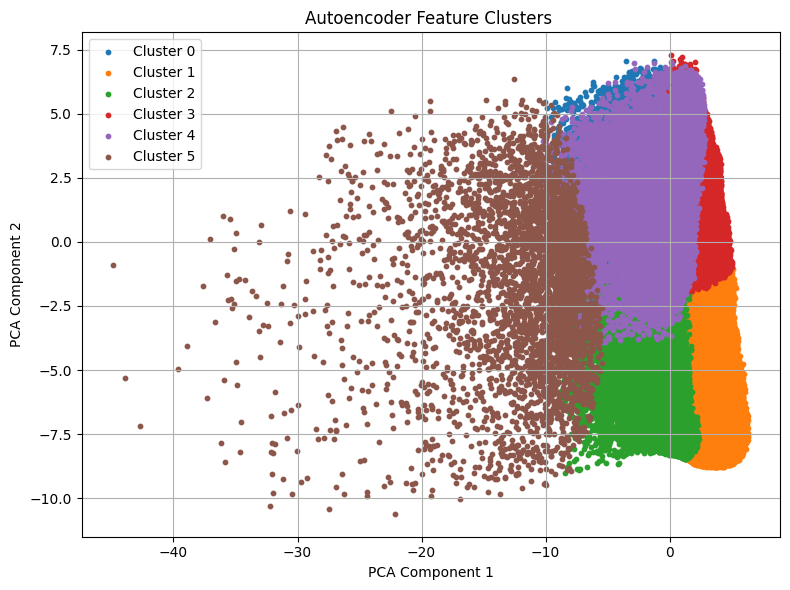

In [ ]:
# Number of clusters
n_clusters = 6

# KMeans clustering on autoencoded features
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(X_autoenc)

# Reduce to 2D for visualization
pca_vis = PCA(n_components=2)
X_vis = pca_vis.fit_transform(X_autoenc)

# Scatter plot of clusters
plt.figure(figsize=(8, 6))
for i in range(n_clusters):
    plt.scatter(X_vis[cluster_labels == i, 0],
                X_vis[cluster_labels == i, 1],
                s=10, label=f'Cluster {i}')
plt.title("Autoencoder Feature Clusters ")
plt.ylabel("PCA Component 2")
plt.xlabel("PCA Component 1")

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()




In [ ]:
# Silhouette Score
score = silhouette_score(X_autoenc, cluster_labels)
print("Silhouette Score (Autoencoder Features):", round(score, 4))

Silhouette Score (Autoencoder Features): 0.2518


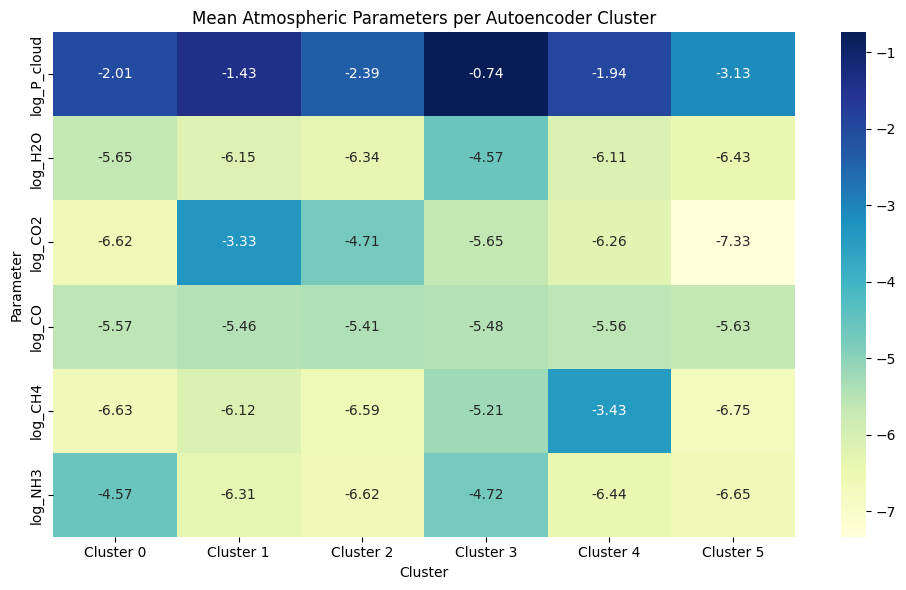

In [ ]:
selected_params = ['log_P_cloud', 'log_H2O', 'log_CO2',
                   'log_CO', 'log_CH4', 'log_NH3']

params_df = pd.DataFrame(data[:, 274:], columns=selected_params)
params_df['cluster'] = cluster_labels

cluster_means = params_df.groupby('cluster')[selected_params].mean()

# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(cluster_means.T, annot=True, fmt=".2f", cmap='YlGnBu',
            xticklabels=[f'Cluster {i}' for i in cluster_means.index],
            yticklabels=selected_params)

plt.title("Mean Atmospheric Parameters per Autoencoder Cluster")
plt.xlabel("Cluster")
plt.ylabel("Parameter")
plt.tight_layout()
plt.show()



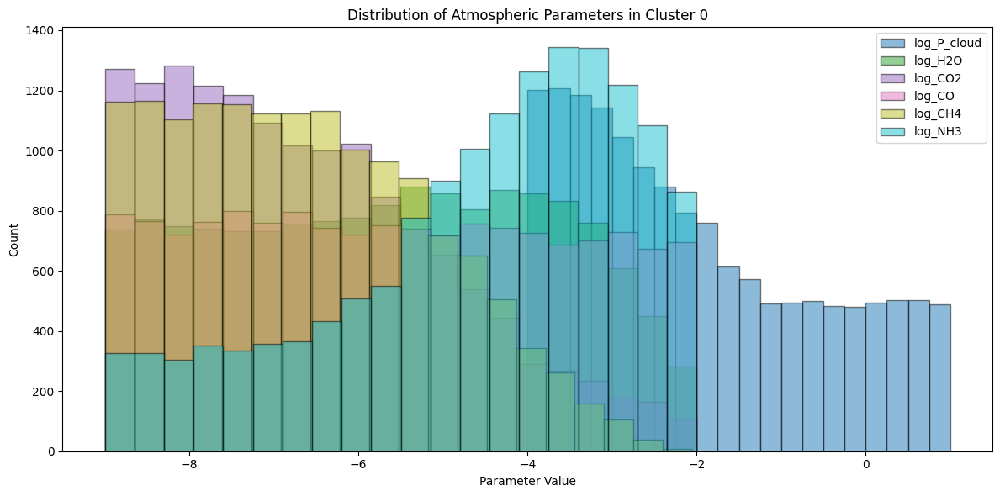

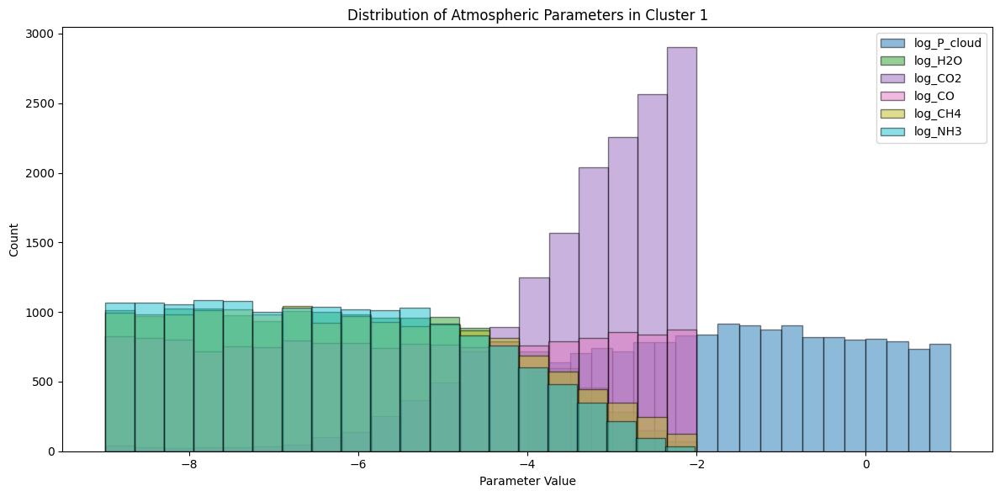

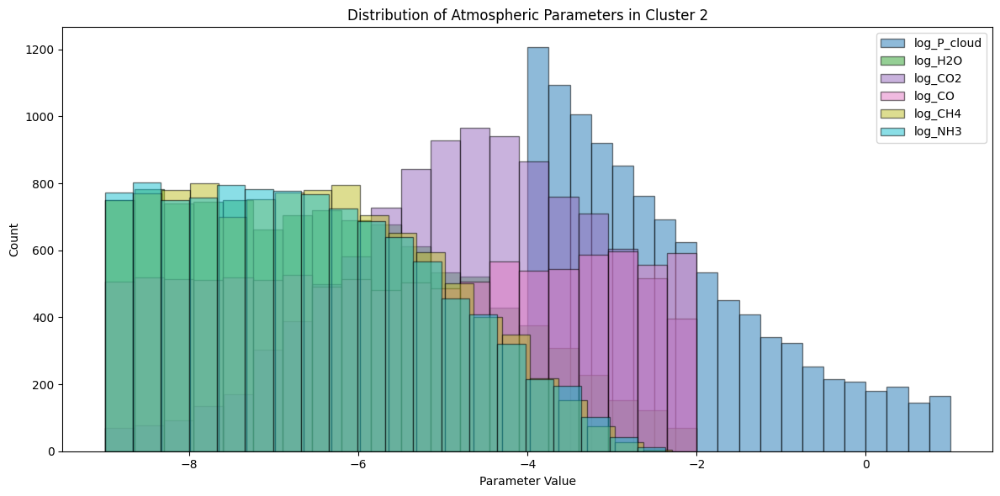

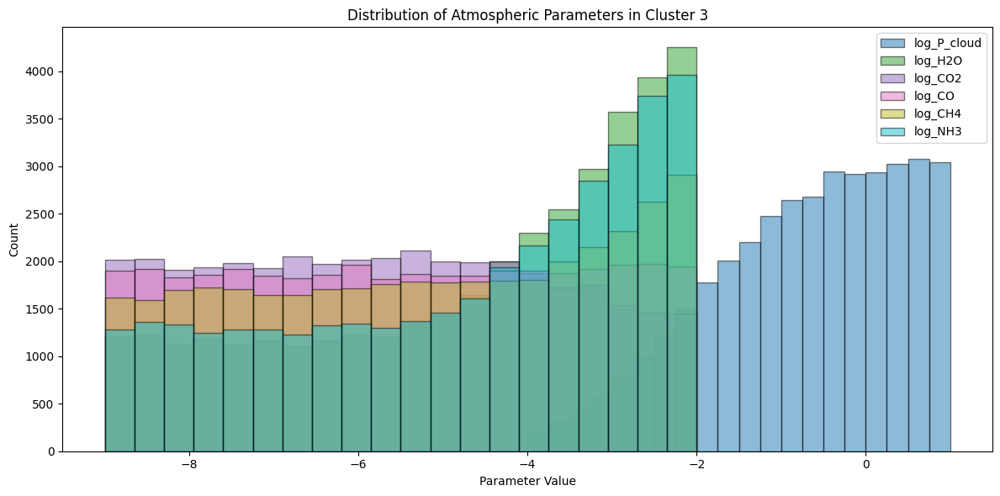

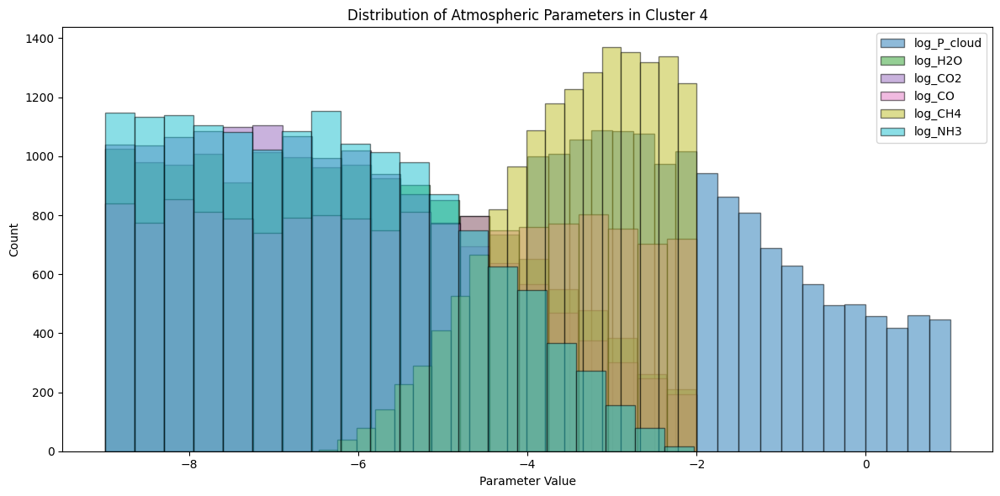

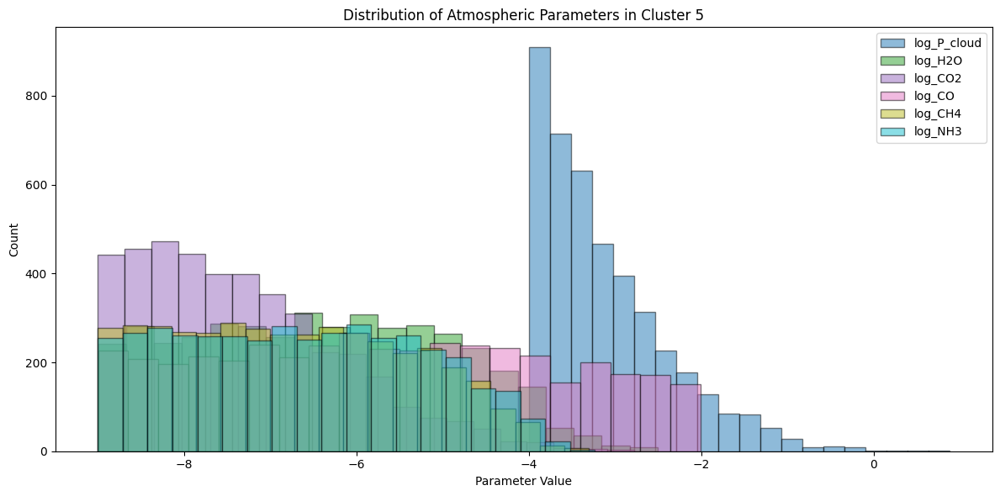

In [ ]:
# Define colors for consistency
colors = plt.cm.tab10(np.linspace(0, 1, len(selected_params)))

# Loop through each cluster
for cluster_id in sorted(params_df['cluster'].unique()):
    cluster_data = params_df[params_df['cluster'] == cluster_id]

    plt.figure(figsize=(12, 6))
    for i, param in enumerate(selected_params):
        plt.hist(cluster_data[param], bins=20, alpha=0.5, label=param,
                 color=colors[i], edgecolor='black')

    plt.title(f"Distribution of Atmospheric Parameters in Cluster {cluster_id}")
    plt.xlabel("Parameter Value")
    plt.ylabel("Count")
    plt.legend()
    plt.tight_layout()
    plt.show()


In [ ]:
# selected_params = ['log_P_cloud', 'log_H2O', 'log_CO2', 'log_CO', 'log_CH4', 'log_NH3']
# params = data[:, 274:]

# # Combine encoded features and selected parameters
# combined_data = np.hstack([X_autoenc, params])

# # Save as plain numeric CSV
# np.savetxt("/content/drive/MyDrive/autoenc.csv", combined_data, delimiter=",")

# print("Saved: /content/drive/MyDrive/autoenc.csv with shape", combined_data.shape)


Saved: /content/drive/MyDrive/autoenc.csv with shape (98664, 14)


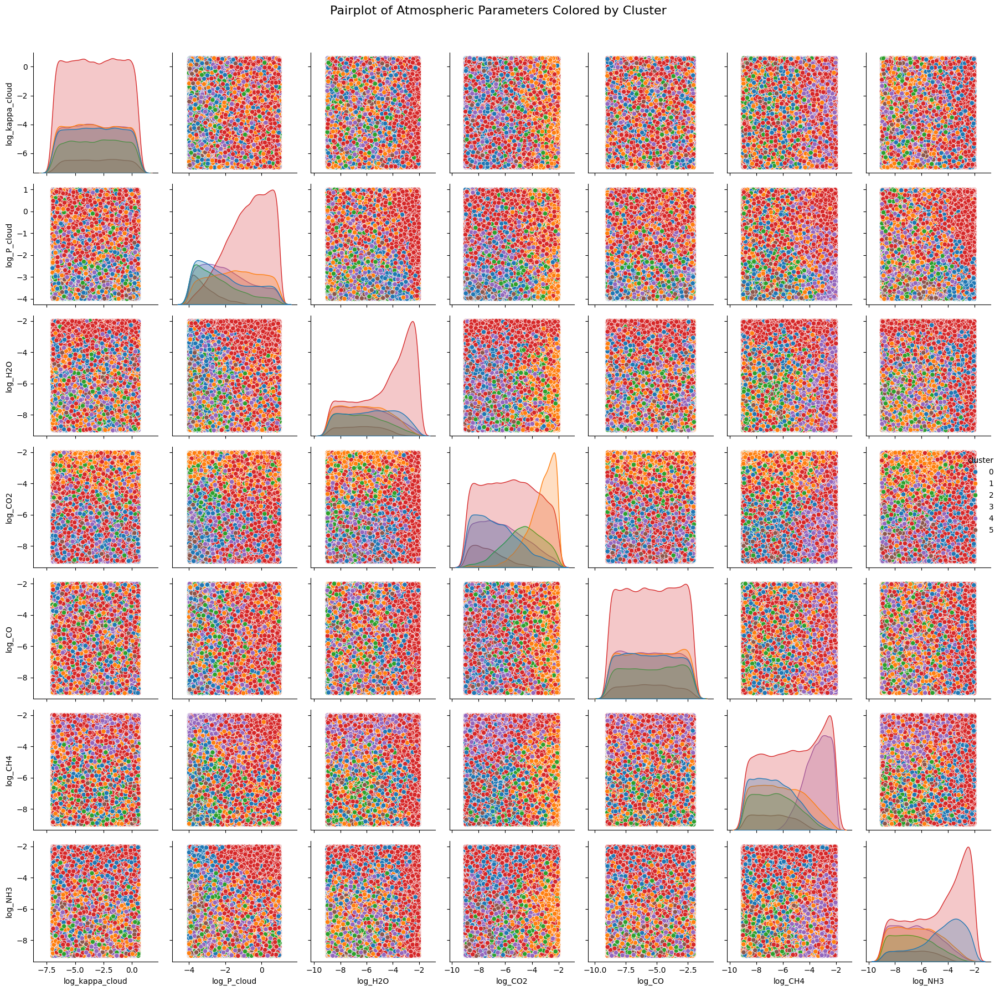

In [ ]:
# Select the 7 key atmospheric parameters
selected_params = ['log_kappa_cloud', 'log_P_cloud', 'log_H2O',
                   'log_CO2', 'log_CO', 'log_CH4', 'log_NH3']

# Create a DataFrame with just those parameters
params_df = pd.DataFrame(data[:, 273:], columns=selected_params)

# Add cluster labels as a new column
params_df['cluster'] = cluster_labels

# Create the pairplot
sns.pairplot(params_df, hue='cluster', palette='tab10', diag_kind='kde')
plt.suptitle("Pairplot of Atmospheric Parameters Colored by Cluster", y=1.02, fontsize=16)
plt.tight_layout()
plt.show()


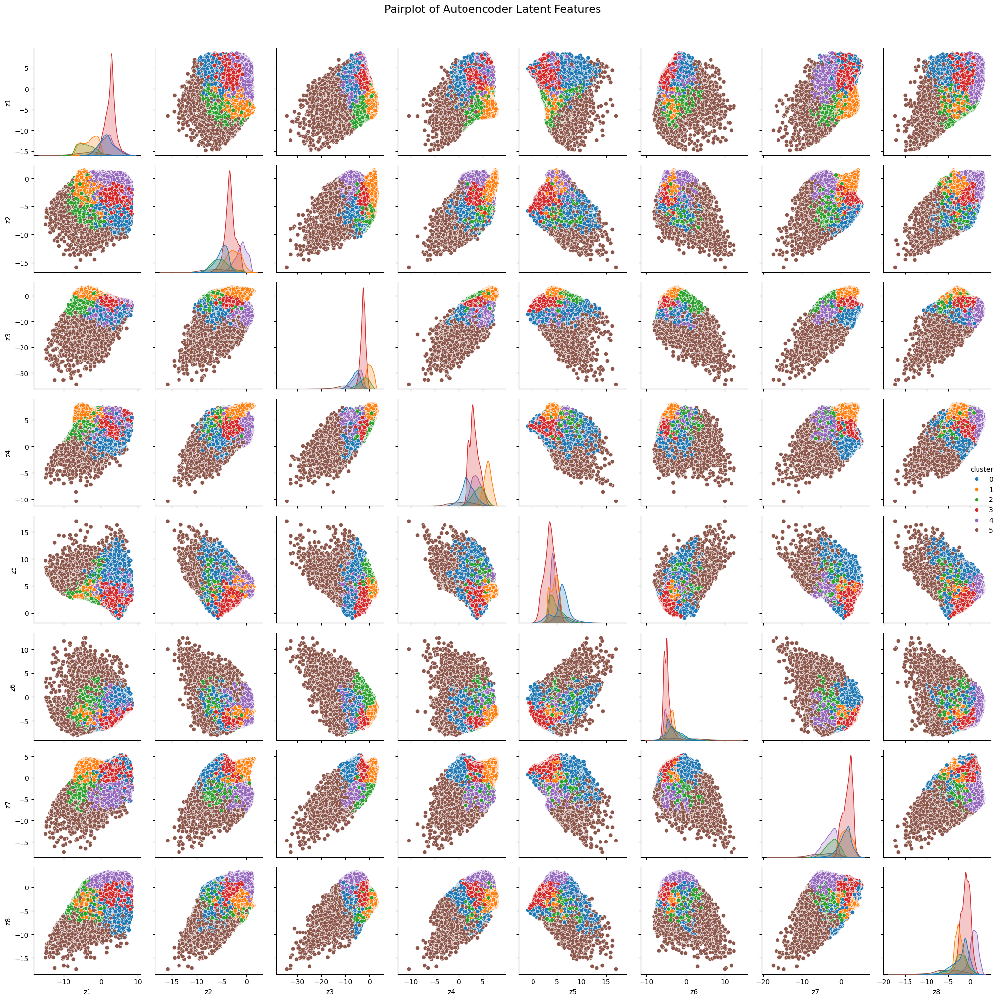

In [ ]:
latent_df = pd.DataFrame(X_autoenc, columns=[f'z{i+1}' for i in range(X_autoenc.shape[1])])

# Add cluster labels
latent_df['cluster'] = cluster_labels

# Create the pairplot
sns.pairplot(latent_df, hue='cluster', palette='tab10', diag_kind='kde')
plt.suptitle("Pairplot of Autoencoder Latent Features ", y=1.02, fontsize=16)
plt.tight_layout()
plt.show()